# Aug 10th, 2022 (cos sim 8 x conds: 512)

**Motivation**:  <br>

In [1]:
# HIDE CODE


import os
import sys
from pprint import pprint
from copy import deepcopy as dc
from os.path import join as pjoin
from scipy.ndimage import gaussian_filter
from IPython.display import display, IFrame, HTML

# tmp & extras dir
git_dir = pjoin(os.environ['HOME'], 'Dropbox/git')
extras_dir = pjoin(git_dir, 'jb-Ca-fMRI/_extras')
fig_base_dir = pjoin(git_dir, 'jb-Ca-fMRI/figs')
tmp_dir = pjoin(git_dir, 'jb-Ca-fMRI/tmp')

# GitHub
sys.path.insert(0, pjoin(git_dir, '_Ca-fMRI'))
from figures.fighelper import *
from analysis.final import *
from utils.render import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from tqdm.notebook import tqdm
%matplotlib inline
set_style()

## Fig dir

In [2]:
fig_dir = pjoin(fig_base_dir, 'paper2.0', '8x')
os.makedirs(fig_dir, exist_ok=True)
print(fig_dir)

merge_thres = {
    128: 0.376,
    512: 0.444,
}
kws_fig = {
    'transparent': True,
    'bbox_inches': 'tight',
    'dpi': 300,
}

/home/hadi/Dropbox/git/jb-Ca-fMRI/figs/paper2.0/8x

## Prepare (512)

In [3]:
nn = 512
mice = Mice(nn)
*_, props_ca = default_props(mice)
bt = BootStrap(**props_ca)

## Sim results (just show)

-------------------------    K = 3,  d = 10%    -------------------------

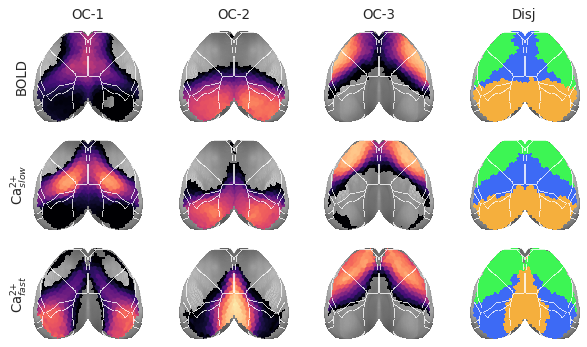

-------------------------------------------------------------------------

-------------------------    K = 3,  d = 15%    -------------------------

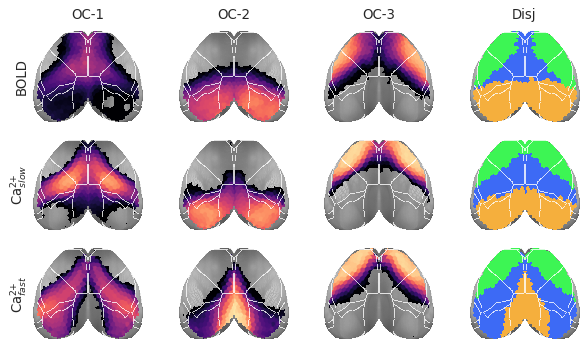

-------------------------------------------------------------------------

-------------------------    K = 3,  d = 20%    -------------------------

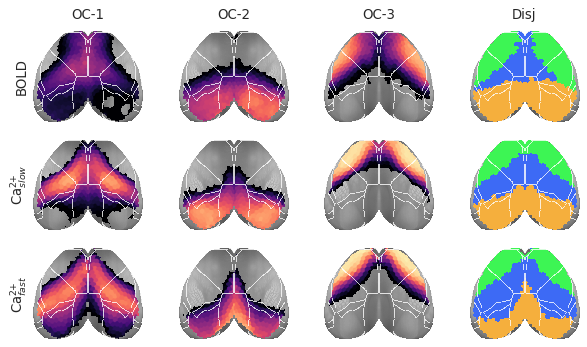

-------------------------------------------------------------------------

-------------------------    K = 3,  d = 25%    -------------------------

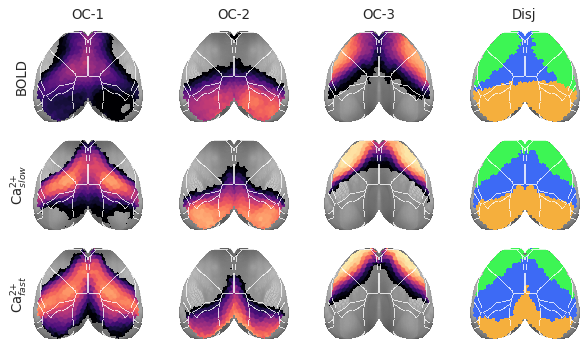

-------------------------------------------------------------------------

-------------------------    K = 7,  d = 10%    -------------------------

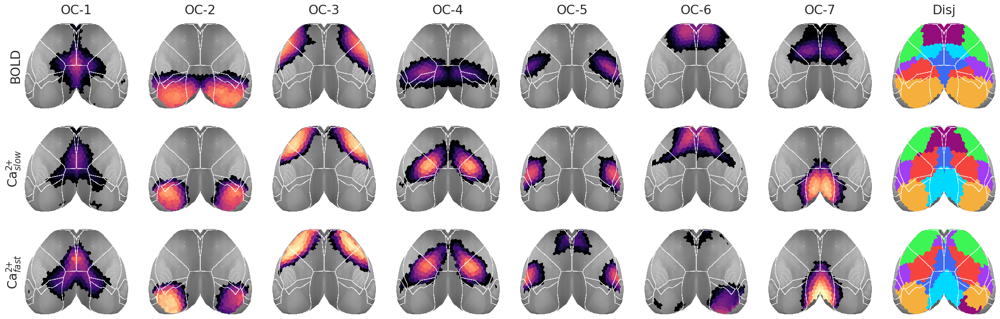

-------------------------------------------------------------------------

-------------------------    K = 7,  d = 15%    -------------------------

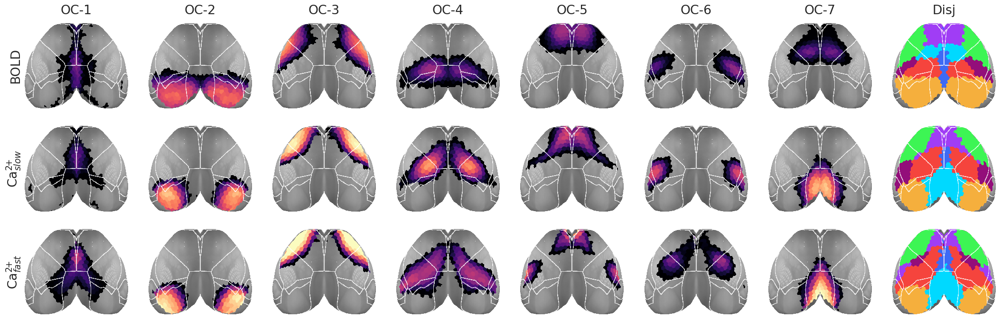

-------------------------------------------------------------------------

-------------------------    K = 7,  d = 20%    -------------------------

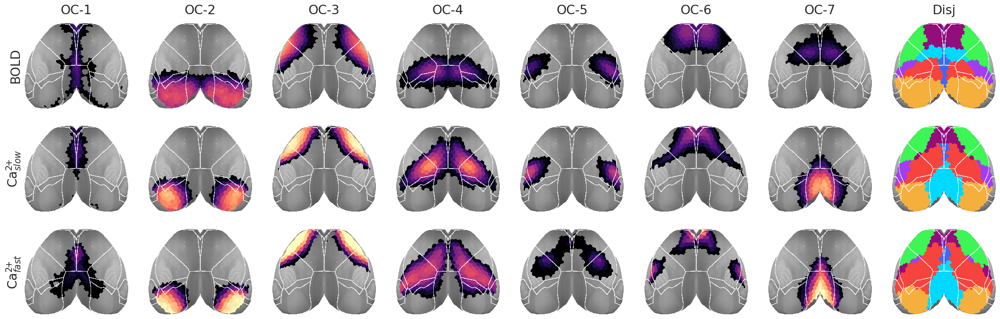

-------------------------------------------------------------------------

-------------------------    K = 7,  d = 25%    -------------------------

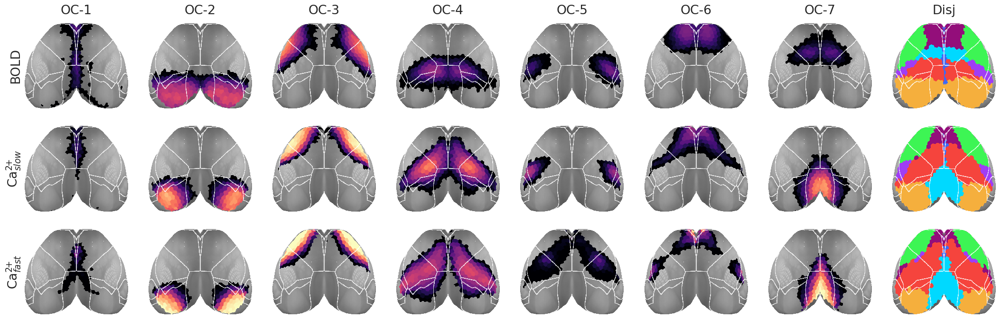

-------------------------------------------------------------------------

-------------------------    K = 20,  d = 10%    -------------------------

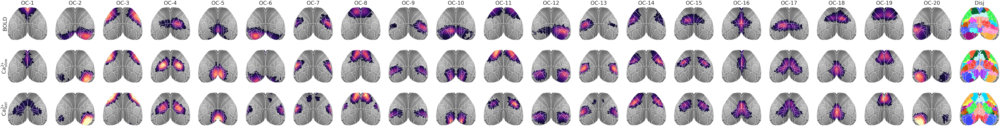

-------------------------------------------------------------------------

-------------------------    K = 20,  d = 15%    -------------------------

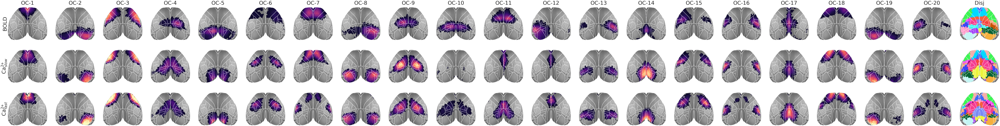

-------------------------------------------------------------------------

-------------------------    K = 20,  d = 20%    -------------------------

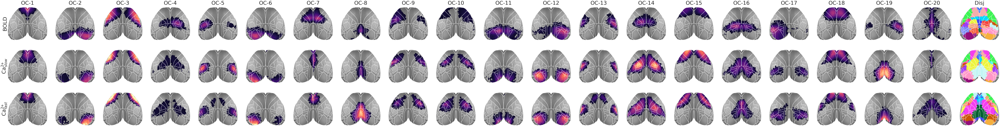

-------------------------------------------------------------------------

-------------------------    K = 20,  d = 25%    -------------------------

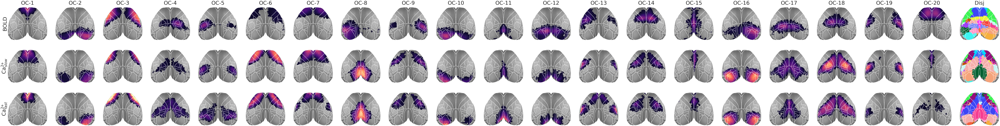

-------------------------------------------------------------------------

CPU times: user 4min 10s, sys: 3min 14s, total: 7min 25s
Wall time: 13min 51s


In [4]:
%%time
looper = itertools.product([3, 7, 20], [10, 15, 20, 25])

for num_k, perc in looper:
    try:
        results = similiarity_results(
            mice=mice,
            perc=perc,
            num_k=num_k,
            n_resamples=None,
            merge_thres=merge_thres[nn]
            if num_k == 7 else None,
        )
        print('-' * 25 + f"    K = {num_k},  d = {perc}%    " + '-' * 25)
        _ = bt.show(results['pi_sorted'], **show_kws(num_k))
        print('-' * 73)
        print('\n\n')
    except AttributeError:
        continue

## Sim results (full)

In [5]:
from figures.fig_ocs import _scores_arr

In [6]:
%%time

scores, std_err = {}, {}
pvalue = np.zeros((3, 4))
statistic = np.zeros((3, 4))
for i, num_k in enumerate([3, 7, 20]):
    res = {}
    for j, perc in enumerate([10, 15, 20, 25]):
        results = similiarity_results(
            mice=mice,
            perc=perc,
            num_k=num_k,
            n_resamples=int(1e3) if
            num_k == 20 else int(1e4),
            merge_thres=merge_thres[nn]
            if num_k == 7 else None,
        )
        res[perc] = results
        test = list(results['tests_overall'].values())[0]
        pvalue[i, j] = test.pvalue
        statistic[i, j] = test.statistic
    s, e = _scores_arr(res, True)
    scores[num_k] = s
    std_err[num_k] = e

CPU times: user 46min 41s, sys: 7min 56s, total: 54min 38s
Wall time: 1h 1min 56s


In [7]:
{k: v.shape for k, v in scores.items()}

{3: (10, 4, 3), 7: (10, 4, 3), 20: (10, 4, 3)}

shape: anim x perc x cond

In [8]:
{k: v.shape for k, v in std_err.items()}

{3: (4, 3), 7: (4, 3), 20: (4, 3)}

shape: perc x cond

In [9]:
statistic.mean(0)

array([0.06937054, 0.04227096, 0.03498195, 0.02805886])

In [10]:
pvalue

array([[1.99998000e-05, 1.99998000e-05, 1.99998000e-05, 3.99996000e-05],
       [1.99998000e-05, 1.99998000e-05, 1.99998000e-05, 1.99998000e-05],
       [1.99980002e-04, 3.79962004e-03, 2.57974203e-02, 3.53564644e-01]])

In [11]:
multipletests(pvalue.ravel(), method='bonferroni')

(
    array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False, False]),
    array([2.39997600e-04, 2.39997600e-04, 2.39997600e-04, 4.79995200e-04,
       2.39997600e-04, 2.39997600e-04, 2.39997600e-04, 2.39997600e-04,
       2.39976002e-03, 4.55954405e-02, 3.09569043e-01, 1.00000000e+00]),
    0.004265318777560645,
    0.004166666666666667
)

## Save

In [12]:
final = {
    'pvalue': pvalue,
    'statistic': statistic,
    'scores_dict': scores,
    'std_err_dict': std_err,
}
np.save(pjoin(fig_dir, f'4x_n{nn}.npy'), final)